In [3]:
import ipdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pylab
import cartopy
import cartopy.crs as ccrs
from utils import constants as cnst
from eod import msg
from utils import u_grid, u_interpolate as u_int, u_darrays as uda, u_met
import glob
import metpy
from metpy import calc
from metpy.units import units
from scipy import stats
import metpy
from metpy import calc
from metpy.units import units
import pickle as pkl

pylab.rcParams['figure.figsize'] = (50., 50.)
%matplotlib inline

In [2]:
cd ..

/home/ck/pythonWorkspace/proj_CEH


In [4]:
regions = {
'equatorial' : [(-5,0)],
'transition' : [(-8,-5)],
'central' : [(-12,-8)],
'southern' : [(-17,-15)]}
h = 2000

In [5]:
topo_full = xr.open_dataset('/media/ck/Elements/SouthAmerica/ERA5/hourly/ERA5_static_hourly_0.25deg_peru.nc')
topo_full = uda.flip_lat(topo_full)

In [6]:
height = xr.open_dataset('/media/ck/Elements/SouthAmerica/ERA5/hourly/topo_ERA5_peru.nc')


In [7]:
def read(region):
    
    alls = regions[region]
    hei = height['h'].sel(latitude=slice(alls[0][0], alls[0][1])).mean('latitude').squeeze()
    topo = topo_full['z'].sel(latitude=slice(alls[0][0], alls[0][1])).mean('latitude').squeeze()
    inpath = '/media/ck/Elements/SouthAmerica/ERA5/hourly/'+region+'_cross_15UTC_1985-2018_peru_v2.nc'
    
    ds = xr.open_dataset(inpath)
    ds_filtered = ds.where(ds['z']>topo)
    
    return ds_filtered

In [8]:
def calc_from_era(ds):
    pdub = np.array([list(ds.level.values),]*len(ds.longitude)).T
    p = units.Quantity(pdub, 'hPa')
    #print(p)
    t = units.Quantity(ds['t'].values, 'K')
    q = units.Quantity(ds['q'].values, 'kg/kg')
    dew = calc.dewpoint_from_specific_humidity(q, t, p)
    #ipdb.set_trace()
    theta_es = np.array(calc.saturation_equivalent_potential_temperature(p,t))#-273.15
    theta_e = np.array(calc.equivalent_potential_temperature(p,t,dew))#-273.15
    theta = np.array(calc.potential_temperature(p,t))
    theta_e_mine = u_met.theta_e(ds.level.values, ds['t'].values-273.15, ds['q'].values)+273.15
    
    tes = ds['q'].copy(deep=True)
    te = ds['q'].copy(deep=True)
    tem = ds['q'].copy(deep=True)
    th = ds['q'].copy(deep=True)
    
    tes.values = theta_es
    te.values = theta_e
    tem.values = theta_e_mine
    th.values = theta
    ds['theta_es'] = tes
    ds['theta_e'] = te
    ds['theta_em'] = tem
    ds['theta'] = th

    return ds#theta_es, theta_e, theta_e_mine

In [9]:
def apply_drywet(ds, region, spell=3, minus='0days', plus='0days', area=0.2):
    dwspells = pkl.load(open("/home/ck/DIR/cornkle/data/HUARAZ/saves/"+region+"_dw_spellDates_"+str(area)+"perc_v2.p", "rb"))
    
    
    dds = dwspells['dry'+str(spell)] -pd.Timedelta(minus) + pd.Timedelta(plus)
    wds = dwspells['wet'+str(spell)] -pd.Timedelta(minus) + pd.Timedelta(plus)
    
    print('dry', len(dds), 'wet', len(wds))
    xy, x_ind, y_ind  = np.intersect1d(dds, ds.time, return_indices=True)
    dds = dds[x_ind]
    
    xy, x_ind, y_ind  = np.intersect1d(wds, ds.time, return_indices=True)
    wds = wds[x_ind]
    print('dry2', len(dds), 'wet2', len(wds))

    mean_dry = ds.sel(time=dds).mean('time')
    mean_wet = ds.sel(time=wds).mean('time')
    all_dry = ds.sel(time=dds)
    all_wet = ds.sel(time=wds)
    
    ## clims
    doy_dryclim = ds.groupby('time.dayofyear').mean('time').sel(dayofyear=np.unique(dds.dayofyear)).mean('dayofyear')
    doy_wetclim = ds.groupby('time.dayofyear').mean('time').sel(dayofyear=np.unique(wds.dayofyear)).mean('dayofyear')
    
    doy_dryclim = ds.groupby('time.dayofyear').mean('time').sel(dayofyear=np.unique(dds.dayofyear)).mean('dayofyear')
    doy_wetclim = ds.groupby('time.dayofyear').mean('time').sel(dayofyear=np.unique(wds.dayofyear)).mean('dayofyear')
    
    xyd, x_indd, y_indd = np.intersect1d(ds['time.dayofyear'].values,dds.dayofyear.values, return_indices=True)
    xyw, x_indw, y_indw = np.intersect1d(ds['time.dayofyear'].values,wds.dayofyear.values, return_indices=True)
    
    #ipdb.set_trace()
    wdays = []
    for dst in ds.time:
        if dst['time.dayofyear'].values in wds.dayofyear.values:
            wdays.append(dst.time.values)
    ddays = []
    for dst in ds.time:
        if dst['time.dayofyear'].values in dds.dayofyear.values:
            ddays.append(dst.time.values)
    #ipdb.set_trace()
    doy_dryclim_all = ds.sel(time=ddays)
    doy_wetclim_all = ds.sel(time=wdays)
    #
    mean_clim = ds.mean('time')
    
    
    for dat in [mean_dry, mean_wet, doy_dryclim, doy_wetclim, mean_clim]:
        dat = calc_from_era(dat)
    
    
    outdic = {'dry' : mean_dry,
              'wet' : mean_wet,
              'dry_ttest' : all_dry,
              'wet_ttest' : all_wet,
              'dry_doyclim' : doy_dryclim,
              'wet_doyclim' : doy_wetclim,
              'mean_clim' : mean_clim,
              'all_clim' : ds,
              'dry_doyclim_ttest' : doy_dryclim_all,
              'wet_doyclim_ttest' : doy_wetclim_all}
    
    return outdic

In [10]:
ar = 0.2
spelldays = 5

In [11]:
reg_tag = 'transition'
ds_filtered = read(reg_tag)

In [12]:
transition_dic = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='0days', plus='1days', area=ar)
transition_dic_n1 = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='1days', plus='0days', area=ar)

dry 670 wet 372
dry2 668 wet2 372
dry 670 wet 372
dry2 668 wet2 372


In [13]:
reg_tag = 'equatorial'
ds_filtered = read(reg_tag)

In [14]:
equatorial_dic = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='0days', plus='1days', area=ar)
equatorial_dic_n1 = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='1days', plus='0days', area=ar)

dry 733 wet 407
dry2 726 wet2 406
dry 733 wet 407
dry2 722 wet2 407


In [15]:
reg_tag = 'central'
ds_filtered = read(reg_tag)

In [16]:
central_dic = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='0days', plus='1days', area=ar)
central_dic_n1 = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='1days', plus='0days', area=ar)

dry 349 wet 383
dry2 341 wet2 383
dry 349 wet 383
dry2 339 wet2 382


In [17]:
reg_tag = 'southern'
ds_filtered = read(reg_tag)

In [18]:
southern_dic = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='0days', plus='1days', area=ar)
southern_dic_n1 = apply_drywet(ds_filtered, reg_tag, spell=spelldays, minus='1days', plus='0days', area=ar)

dry 119 wet 85
dry2 113 wet2 83
dry 119 wet 85
dry2 113 wet2 83


In [19]:
def draw_cross(ax, data, lon, lat, title=None, xlabel=None, ylabel=None,  cmap=None,mask_sig=None, quiver=None, contour=None, cbar_label=None, twinx=None, cbar=True,**kwargs):

    mapp = ax.contourf(lon, lat, data, extend='both', alpha=0.8, cmap=cmap, **kwargs)  # this is the actual plot
    
#     cmapp = uplot.discrete_cmap(25, base_cmap=cmap)
#     mapp = ax.pcolormesh(lon, lat,data,cmap=cmapp, vmin=50, vmax=68)
    ax.set_ylim(170,1000)
    #ax.set_xlim(-81.5,-60)
    # Adjust the y-axis to be logarithmic
    #ax.set_yscale('symlog')
    #ax.set_yticklabels(np.arange(1000, 50, -1000)
    
    #ax.set_yticks(np.arange(1000, 50, -100))
    plt.gca().invert_yaxis()
    if mask_sig is not None:
         plt.contourf(lon, lat, mask_sig, colors='none', hatches='.',
                     levels=[0.5, 1], linewidth=0.1)
    
    if quiver is not None:
        
        qu = ax.quiver(quiver['x'], quiver['y'], quiver['u'], quiver['v'], scale=quiver['scale'], width=0.0015, headwidth=6, color='darkblue')
#         qk = plt.quiverkey(qu, 0.45, 0.52, 1, '1 m s$^{-1}$ | ',
#                            labelpos='E', coordinates='figure')
        
    if contour is not None:
        cs = ax.contour(contour['x'], contour['y'], contour['data'], levels=contour['levels'], colors=contour['colours'], linewidths=1 )
        plt.clabel(cs, inline=1, fontsize=8, fmt='%1.1f')  #, fmt='%1.1f'
        
    if twinx is not None:
        ax1 = ax.twinx()
        ax1.plot(twinx['x'], twinx['y'], twinx['color'] )
        ax1.set_ylabel(twinx['ylabel'])
        ax1.set_ylim(twinx['ylim'][0], twinx['ylim'][1])
    
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    if cbar:
        cbar = plt.colorbar(mapp, pad=0.09, format='%1.1f')  # adds colorbar '%d'
        #cbar = plt.colorbar(mapp, ticks=np.linspace(50,68,25), pad=0.09)
        cbar.set_label(cbar_label)
    
    #return mapp

In [20]:
#     outdic = {'dry' : mean_dry,
#               'wet' : mean_wet,
#               'dry_ttest' : all_dry,
#               'wet_ttest' : all_wet,
#               'dry_doyclim' : doy_dryclim,
#               'wet_doyclim' : doy_wetclim,
#               'mean_clim' : mean_clim,
#               'all_clim' : ds,
#               'dry_doyclim_ttest' : doy_dryclim_all,
#               'wet_doyclim_ttest' : doy_wetclim_all}

In [21]:
equatorial_dic.keys()

dict_keys(['dry', 'wet', 'dry_ttest', 'wet_ttest', 'dry_doyclim', 'wet_doyclim', 'mean_clim', 'all_clim', 'dry_doyclim_ttest', 'wet_doyclim_ttest'])

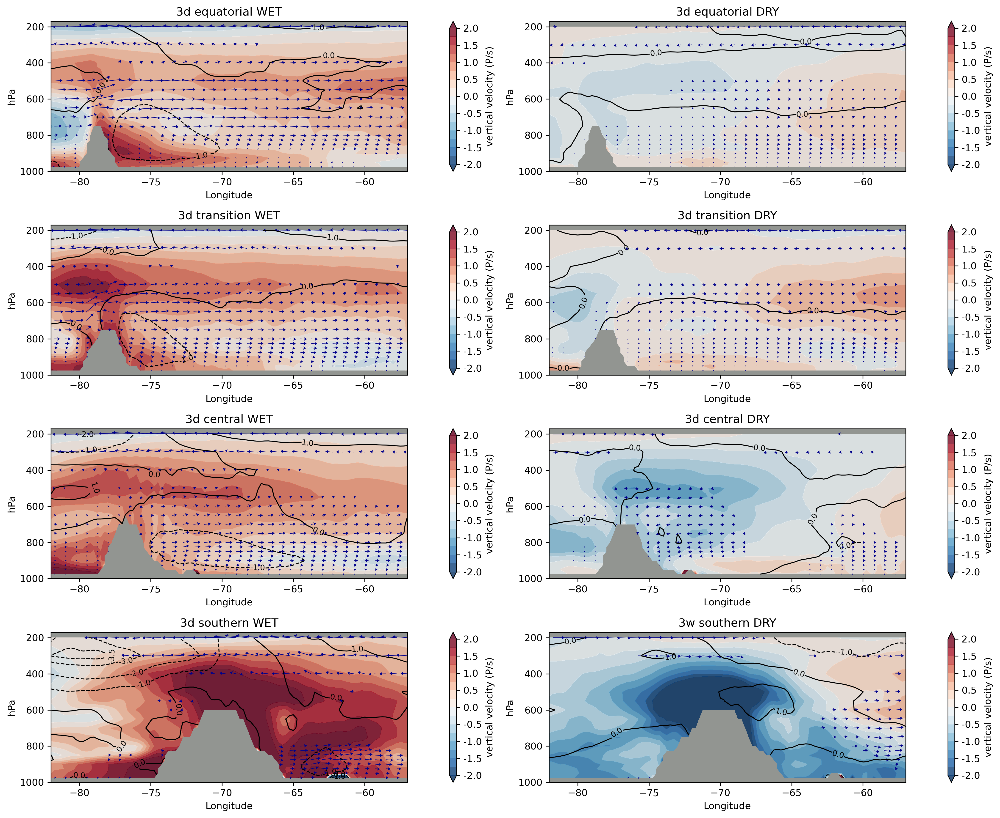

In [22]:
# slices_months = [('3d equatorial WET', equatorial_dic['wet'], equatorial_dic['wet_ttest'],equatorial_dic_n1['wet'], equatorial_dic_n1['wet_ttest']),  ('3d equatorial DRY', equatorial_dic['dry'], equatorial_dic['dry_ttest'],equatorial_dic_n1['dry'], equatorial_dic_n1['dry_ttest']),
#                  ('3d transition WET', transition_dic['wet'], transition_dic['wet_ttest'],transition_dic_n1['wet'], transition_dic_n1['wet_ttest']),  ('3d transition DRY', transition_dic['dry'], transition_dic['dry_ttest'],transition_dic_n1['dry'], transition_dic_n1['dry_ttest']),
#                  ('3d central WET', central_dic['wet'], central_dic['wet_ttest'],central_dic_n1['wet'], central_dic_n1['wet_ttest']),  ('3d central DRY', central_dic['dry'], central_dic['dry_ttest'],central_dic_n1['dry'], central_dic_n1['dry_ttest']),   #dry_clim_allc.mean('time')
#                  ('3d southern WET',southern_dic['wet'], southern_dic['wet_ttest'],southern_dic_n1['wet'], southern_dic_n1['wet_ttest']),  ('3w southern DRY',southern_dic['dry'], southern_dic['dry_ttest'],southern_dic_n1['dry'], southern_dic_n1['dry_ttest']) ]  # mean_wet3, all_wet3, doy_wetclim3, wet_clim_all) ]

slices_months = [('3d equatorial WET', equatorial_dic['wet'], equatorial_dic['wet_ttest'],equatorial_dic['mean_clim'], equatorial_dic['all_clim']),  ('3d equatorial DRY', equatorial_dic['dry'], equatorial_dic['dry_ttest'],equatorial_dic['mean_clim'], equatorial_dic['all_clim']),
                 ('3d transition WET', transition_dic['wet'], transition_dic['wet_ttest'],transition_dic['mean_clim'], transition_dic['all_clim']),  ('3d transition DRY', transition_dic['dry'], transition_dic['dry_ttest'],transition_dic['mean_clim'], transition_dic['all_clim']),
                 ('3d central WET', central_dic['wet'], central_dic['wet_ttest'],central_dic['mean_clim'], central_dic['all_clim']),  ('3d central DRY', central_dic['dry'], central_dic['dry_ttest'],central_dic['mean_clim'], central_dic['all_clim']),   #dry_clim_allc.mean('time')
                 ('3d southern WET',southern_dic['wet'], southern_dic['wet_ttest'],southern_dic['mean_clim'], southern_dic['all_clim']),  ('3w southern DRY',southern_dic['dry'], southern_dic['dry_ttest'],southern_dic['mean_clim'], southern_dic['all_clim']) ]  # mean_wet3, all_wet3, doy_wetclim3, wet_clim_all) ]



f = plt.figure(figsize=(15,12), dpi=300)

for ids, dd in enumerate(slices_months):
    
    slices = dd[1] # d/w mean
    tag = dd[0]

    slices_ttest = dd[2] #  d/w all, for day-wise t-test, all days versus only wet/dry
    slice_clim = dd[3] # doy d/w clim
    clim_ttest = dd[4]

    # "current zonal wind" wind vectors
    #ipdb.set_trace()
    vano = slices['u']
    wano = slices['w']*(-10)  # multiplied by 10 since vertical component is very small compared to horizontal one
    vclim = slice_clim['u']
    wclim = slice_clim['w']*(-10)
    st=2
    stt = 3
    sarrow = 1
    xquiv = slices.longitude[sarrow::stt]
    yquiv = slices.level

    uu = (vano)[::, sarrow::stt]  
    ww = (wano)[::, sarrow::stt]
    uuc = (vclim)[::, sarrow::stt]  
    wwc = (wclim)[::, sarrow::stt]  
    
    uu = uu-uuc
    ww = ww-wwc
    
    utstat, upval = stats.ttest_ind(slices_ttest['u'], clim_ttest['u'], axis=0, equal_var=False)
    umask = upval<=0.05
    
    wtstat, wpval = stats.ttest_ind(slices_ttest['w'], clim_ttest['w'], axis=0, equal_var=False)
    wmask = wpval<=0.05
    
    bothmask = umask[::, sarrow::stt] #| wmask[::, sarrow::stt] 
    #ipdb.set_trace()
    uu = uu.where(bothmask)
    ww = ww.where(bothmask)

    qin = {'x' : xquiv, 'y' : yquiv, 'u' : uu, 'v' : ww, 'scale' : 70}

    # temperature and moisture check

    var = 'theta_e'
    var2 = 'q'
    a = slices_ttest[var2] 
    b = clim_ttest[var2]
    tstat, pval = stats.ttest_ind(a, b, axis=0)
    mask = pval<=0.05
    data2 = (slices[var]- slice_clim[var]) # 
    #data2.values[(~mask) & (np.isfinite(data2.values))] = 0

    data = slices['v'] -slice_clim['v'] #+ ((slices['v']-slice_clim['v']))
    ax = f.add_subplot(4,2,ids+1)
    
    contour = {'data' : data, 'x' :slices.longitude, 'y' : slices.level, 'levels' : [-4.5, -4, -3.5, -3,-2,-1,0,1,2,3,3.5,4,4.5], 'colours' : 'k'}  #np.arange(335,355, 1)
    draw_cross(ax, data2, slices.longitude, slices.level, ylabel = 'hPa', xlabel='Longitude',cmap='RdBu_r', quiver=qin, contour=contour, cbar_label='vertical velocity (P/s)', levels=np.arange(-2, 2.1, 0.25), title=tag)  #Spectral
    #ax.streamplot(slices.longitude, slices.level, uu, ww, density=[0.5, 1], color='k', linewidth=0.5)
#     ax.contourf(slices.longitude, slices.level, mask, colors='none', hatches='.',
#                      levels=[0.5, 1], linewidth=0.1)
    ax.set_facecolor('xkcd:grey')
#     if region == 'southern':
#         ax.set_xlim(-80,-57)
#     else:
#         ax.set_xlim(-81.5,-65)
        
    plt.tight_layout()
    #f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/cross/'+var+'_drywet_'+pregion+'_doyClim.jpg')


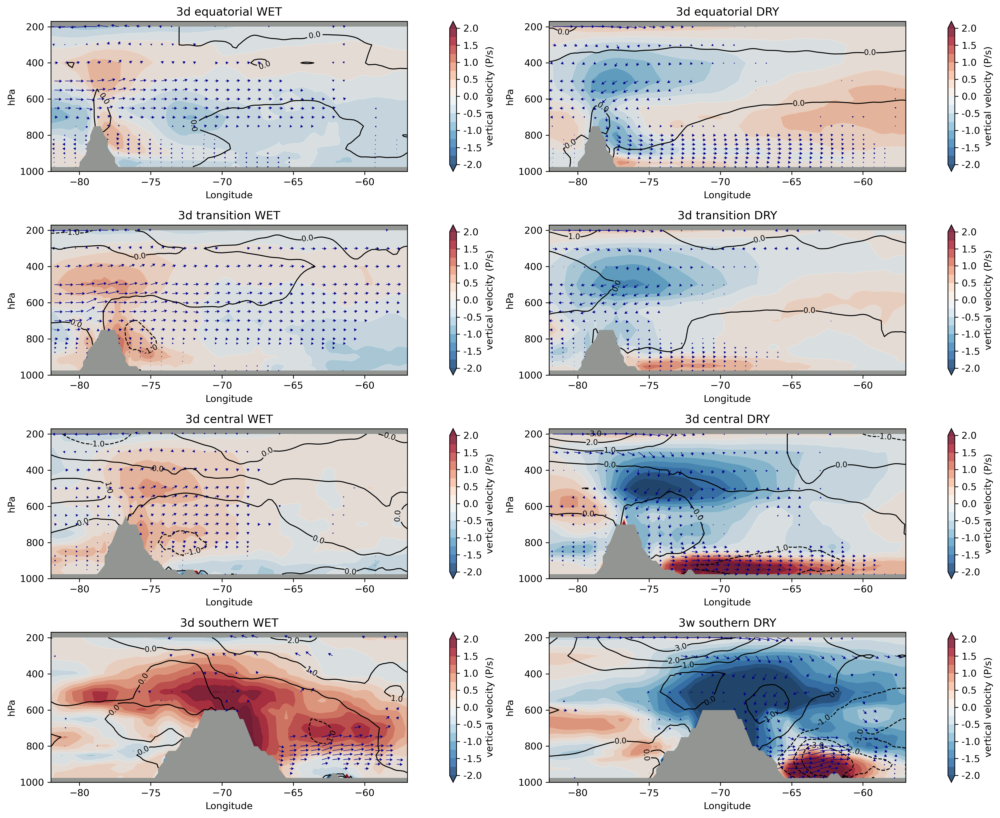

In [23]:
slices_months = [('3d equatorial WET', equatorial_dic['wet'], equatorial_dic['wet_ttest'],equatorial_dic_n1['wet'], equatorial_dic_n1['wet_ttest']),  ('3d equatorial DRY', equatorial_dic['dry'], equatorial_dic['dry_ttest'],equatorial_dic_n1['dry'], equatorial_dic_n1['dry_ttest']),
                 ('3d transition WET', transition_dic['wet'], transition_dic['wet_ttest'],transition_dic_n1['wet'], transition_dic_n1['wet_ttest']),  ('3d transition DRY', transition_dic['dry'], transition_dic['dry_ttest'],transition_dic_n1['dry'], transition_dic_n1['dry_ttest']),
                 ('3d central WET', central_dic['wet'], central_dic['wet_ttest'],central_dic_n1['wet'], central_dic_n1['wet_ttest']),  ('3d central DRY', central_dic['dry'], central_dic['dry_ttest'],central_dic_n1['dry'], central_dic_n1['dry_ttest']),   #dry_clim_allc.mean('time')
                 ('3d southern WET',southern_dic['wet'], southern_dic['wet_ttest'],southern_dic_n1['wet'], southern_dic_n1['wet_ttest']),  ('3w southern DRY',southern_dic['dry'], southern_dic['dry_ttest'],southern_dic_n1['dry'], southern_dic_n1['dry_ttest']) ]  # mean_wet3, all_wet3, doy_wetclim3, wet_clim_all) ]

# slices_months = [('3d equatorial WET', equatorial_dic['wet'], equatorial_dic['wet_ttest'],equatorial_dic['wet_doyclim'], equatorial_dic['wet_doyclim_ttest']),  ('3d equatorial DRY', equatorial_dic['dry'], equatorial_dic['dry_ttest'],equatorial_dic['dry_doyclim'], equatorial_dic['dry_doyclim_ttest']),
#                  ('3d transition WET', transition_dic['wet'], transition_dic['wet_ttest'],transition_dic['wet_doyclim'], transition_dic['wet_doyclim_ttest']),  ('3d transition DRY', transition_dic['dry'], transition_dic['dry_ttest'],transition_dic['dry_doyclim'], transition_dic['dry_doyclim_ttest']),
#                  ('3d central WET', central_dic['wet'], central_dic['wet_ttest'],central_dic['wet_doyclim'], central_dic['wet_doyclim_ttest']),  ('3d central DRY', central_dic['dry'], central_dic['dry_ttest'],central_dic['dry_doyclim'], central_dic['dry_doyclim_ttest']),   #dry_clim_allc.mean('time')
#                  ('3d southern WET',southern_dic['wet'], southern_dic['wet_ttest'],southern_dic['wet_doyclim'], southern_dic['wet_doyclim_ttest']),  ('3w southern DRY',southern_dic['dry'], southern_dic['dry_ttest'],southern_dic['dry_doyclim'], southern_dic['dry_doyclim_ttest']) ]  # mean_wet3, all_wet3, doy_wetclim3, wet_clim_all) ]



f = plt.figure(figsize=(15,12), dpi=300)

for ids, dd in enumerate(slices_months):
    
    slices = dd[1] # d/w mean
    tag = dd[0]

    slices_ttest = dd[2] #  d/w all, for day-wise t-test, all days versus only wet/dry
    slice_clim = dd[3] # doy d/w clim
    clim_ttest = dd[4]

    # "current zonal wind" wind vectors
    #ipdb.set_trace()
    vano = slices['u']
    wano = slices['w']*(-10)  # multiplied by 10 since vertical component is very small compared to horizontal one
    vclim = slice_clim['u']
    wclim = slice_clim['w']*(-10)
    st=2
    stt = 3
    sarrow = 1
    xquiv = slices.longitude[sarrow::stt]
    yquiv = slices.level

    uu = (vano)[::, sarrow::stt]  
    ww = (wano)[::, sarrow::stt]
    uuc = (vclim)[::, sarrow::stt]  
    wwc = (wclim)[::, sarrow::stt]  
    
    uu = uu-uuc
    ww = ww-wwc
    
    utstat, upval = stats.ttest_ind(slices_ttest['u'], clim_ttest['u'], axis=0, equal_var=False)
    umask = upval<=0.05
    
    wtstat, wpval = stats.ttest_ind(slices_ttest['w'], clim_ttest['w'], axis=0, equal_var=False)
    wmask = wpval<=0.05
    
    bothmask = umask[::, sarrow::stt] | wmask[::, sarrow::stt] 
    #ipdb.set_trace()
    uu = uu.where(bothmask)
    ww = ww.where(bothmask)

    qin = {'x' : xquiv, 'y' : yquiv, 'u' : uu, 'v' : ww, 'scale' : 70}

    # temperature and moisture check

    var = 'theta_e'
    var2 = 'q'
    a = slices_ttest[var2] 
    b = clim_ttest[var2]
    tstat, pval = stats.ttest_ind(a, b, axis=0)
    mask = pval<=0.05
    data2 = (slices[var]- slice_clim[var]) # 
    #data2.values[(~mask) & (np.isfinite(data2.values))] = 0

    data = slices['v'] -slice_clim['v'] #+ ((slices['v']-slice_clim['v']))
    ax = f.add_subplot(4,2,ids+1)
    
    contour = {'data' : data, 'x' :slices.longitude, 'y' : slices.level, 'levels' : np.arange(-3,3.6,1), 'colours' : 'k'}  #np.arange(335,355, 1)
    draw_cross(ax, data2, slices.longitude, slices.level, ylabel = 'hPa', xlabel='Longitude',cmap='RdBu_r', quiver=qin, contour=contour, cbar_label='vertical velocity (P/s)', levels=np.arange(-2, 2.1, 0.25), title=tag)  #Spectral
    #ax.streamplot(slices.longitude, slices.level, uu, ww, density=[0.5, 1], color='k', linewidth=0.5)
#     ax.contourf(slices.longitude, slices.level, mask, colors='none', hatches='.',
#                      levels=[0.5, 1], linewidth=0.1)
    ax.set_facecolor('xkcd:grey')
#     if region == 'southern':
#         ax.set_xlim(-80,-57)
#     else:
#         ax.set_xlim(-81.5,-65)
        
    plt.tight_layout()
    #f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/cross/'+var+'_drywet_'+pregion+'_doyClim.jpg')


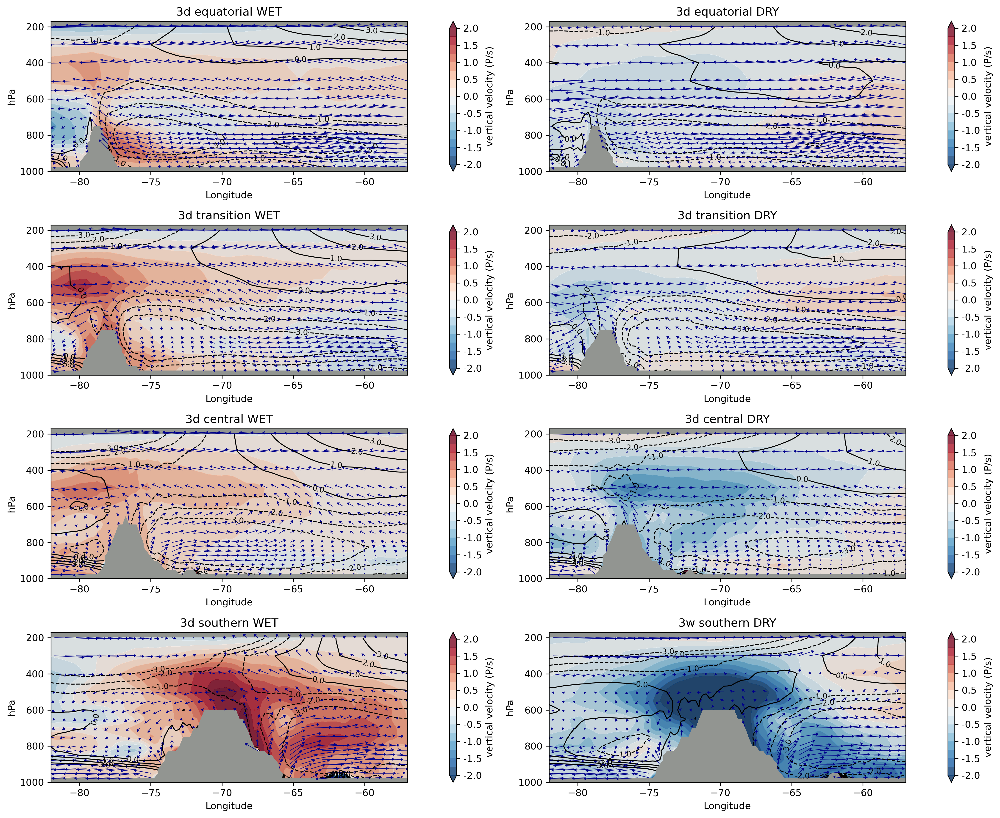

In [24]:
# slices_months = [('3d equatorial WET', equatorial_dic['wet'], equatorial_dic['wet_ttest'],equatorial_dic_n1['wet'], equatorial_dic_n1['wet_ttest']),  ('3d equatorial DRY', equatorial_dic['dry'], equatorial_dic['dry_ttest'],equatorial_dic_n1['dry'], equatorial_dic_n1['dry_ttest']),
#                  ('3d transition WET', transition_dic['wet'], transition_dic['wet_ttest'],transition_dic_n1['wet'], transition_dic_n1['wet_ttest']),  ('3d transition DRY', transition_dic['dry'], transition_dic['dry_ttest'],transition_dic_n1['dry'], transition_dic_n1['dry_ttest']),
#                  ('3d central WET', central_dic['wet'], central_dic['wet_ttest'],central_dic_n1['wet'], central_dic_n1['wet_ttest']),  ('3d central DRY', central_dic['dry'], central_dic['dry_ttest'],central_dic_n1['dry'], central_dic_n1['dry_ttest']),   #dry_clim_allc.mean('time')
#                  ('3d southern WET',southern_dic['wet'], southern_dic['wet_ttest'],southern_dic_n1['wet'], southern_dic_n1['wet_ttest']),  ('3w southern DRY',southern_dic['dry'], southern_dic['dry_ttest'],southern_dic_n1['dry'], southern_dic_n1['dry_ttest']) ]  # mean_wet3, all_wet3, doy_wetclim3, wet_clim_all) ]

slices_months = [('3d equatorial WET', equatorial_dic['wet'], equatorial_dic['wet_ttest'],equatorial_dic['wet_doyclim'], equatorial_dic['wet_doyclim_ttest']),  ('3d equatorial DRY', equatorial_dic['dry'], equatorial_dic['dry_ttest'],equatorial_dic['dry_doyclim'], equatorial_dic['dry_doyclim_ttest']),
                 ('3d transition WET', transition_dic['wet'], transition_dic['wet_ttest'],transition_dic['wet_doyclim'], transition_dic['wet_doyclim_ttest']),  ('3d transition DRY', transition_dic['dry'], transition_dic['dry_ttest'],transition_dic['dry_doyclim'], transition_dic['dry_doyclim_ttest']),
                 ('3d central WET', central_dic['wet'], central_dic['wet_ttest'],central_dic['wet_doyclim'], central_dic['wet_doyclim_ttest']),  ('3d central DRY', central_dic['dry'], central_dic['dry_ttest'],central_dic['dry_doyclim'], central_dic['dry_doyclim_ttest']),   #dry_clim_allc.mean('time')
                 ('3d southern WET',southern_dic['wet'], southern_dic['wet_ttest'],southern_dic['wet_doyclim'], southern_dic['wet_doyclim_ttest']),  ('3w southern DRY',southern_dic['dry'], southern_dic['dry_ttest'],southern_dic['dry_doyclim'], southern_dic['dry_doyclim_ttest']) ]  # mean_wet3, all_wet3, doy_wetclim3, wet_clim_all) ]



f = plt.figure(figsize=(15,12), dpi=300)

for ids, dd in enumerate(slices_months):
    
    slices = dd[1] # d/w mean
    tag = dd[0]

    slices_ttest = dd[2] #  d/w all, for day-wise t-test, all days versus only wet/dry
    slice_clim = dd[3] # doy d/w clim
    clim_ttest = dd[4]

    # "current zonal wind" wind vectors
    #ipdb.set_trace()
    vano = slices['u']
    wano = slices['w']*(-10)  # multiplied by 10 since vertical component is very small compared to horizontal one
    vclim = slice_clim['u']
    wclim = slice_clim['w']*(-10)
    st=2
    stt = 3
    sarrow = 1
    xquiv = slices.longitude[sarrow::stt]
    yquiv = slices.level

    uu = (vano)[::, sarrow::stt]  
    ww = (wano)[::, sarrow::stt]
    uuc = (vclim)[::, sarrow::stt]  
    wwc = (wclim)[::, sarrow::stt]  
    
    uu = uu#-uuc
    ww = ww#-wwc
    
    utstat, upval = stats.ttest_ind(slices_ttest['u'], clim_ttest['u'], axis=0, equal_var=False)
    umask = upval<=0.05
    
    wtstat, wpval = stats.ttest_ind(slices_ttest['w'], clim_ttest['w'], axis=0, equal_var=False)
    wmask = wpval<=0.05
    
    bothmask = umask[::, sarrow::stt] | wmask[::, sarrow::stt] 
    #ipdb.set_trace()
    uu = uu#.where(bothmask)
    ww = ww#.where(bothmask)

    qin = {'x' : xquiv, 'y' : yquiv, 'u' : uu, 'v' : ww, 'scale' : 70}

    # temperature and moisture check

    var = 'theta_e'
    var2 = 'q'
    a = slices_ttest[var2] 
    b = clim_ttest[var2]
    tstat, pval = stats.ttest_ind(a, b, axis=0)
    mask = pval<=0.05
    data2 = (slices[var]- slice_clim[var]) # 
    #data2.values[(~mask) & (np.isfinite(data2.values))] = 0

    data = slices['v'] #-slice_clim['v'] + ((slices['v']-slice_clim['v']))
    ax = f.add_subplot(4,2,ids+1)
    
    contour = {'data' : data, 'x' :slices.longitude, 'y' : slices.level, 'levels' : np.arange(-3,3.6,1), 'colours' : 'k'}  #np.arange(335,355, 1)
    draw_cross(ax, data2, slices.longitude, slices.level, ylabel = 'hPa', xlabel='Longitude',cmap='RdBu_r', quiver=qin, contour=contour, cbar_label='vertical velocity (P/s)', levels=np.arange(-2, 2.1, 0.25), title=tag)  #Spectral
    #ax.streamplot(slices.longitude, slices.level, uu, ww, density=[0.5, 1], color='k', linewidth=0.5)
#     ax.contourf(slices.longitude, slices.level, mask, colors='none', hatches='.',
#                      levels=[0.5, 1], linewidth=0.1)
    ax.set_facecolor('xkcd:grey')
#     if region == 'southern':
#         ax.set_xlim(-80,-57)
#     else:
#         ax.set_xlim(-81.5,-65)
        
    plt.tight_layout()
    #f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/cross/'+var+'_drywet_'+pregion+'_doyClim.jpg')

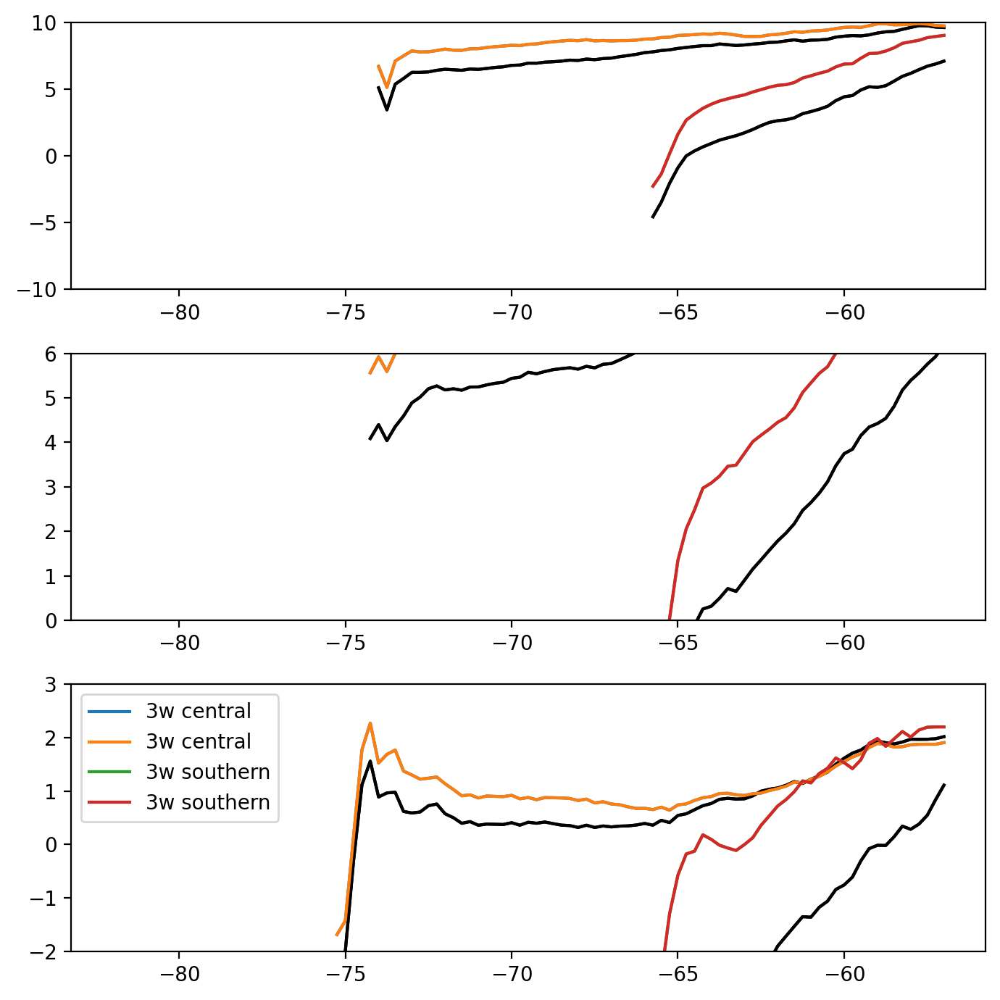

In [22]:
f = plt.figure(figsize=(7,7), dpi=200)

ranges = [(-10,10), (0,6), (-2,3)]

for pan, bi in enumerate([(950,600),(925,600),(850,600)]):
    ax = f.add_subplot(3,1,pan+1)
    
    for ids, dd in enumerate(slices_months):

        slices = dd[1] # d/w mean
        tag = dd[0]

        slices_ttest = dd[2] #  d/w all, for day-wise t-test, all days versus only wet/dry
        slice_clim = dd[3] # doy d/w clim
        clim_ttest = dd[4]

        ul = 600
        dl = 850

        th_es = slices['theta_es'].sel(level=bi[1])
        th_e = slices['theta_e'].sel(level=bi[0])

        th_es_clim = slice_clim['theta_es'].sel(level=bi[1])
        th_e_clim = slice_clim['theta_e'].sel(level=bi[0])

        ax.plot(th_es.longitude, th_e_clim-th_es_clim, color='k')
        ax.plot(th_es.longitude, th_e-th_es, label=tag)

        ax.set_ylim(ranges[pan][0],ranges[pan][1])
        #ax.set_xlim(-74,-66)
plt.tight_layout()
plt.legend()
#f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/cross/'+var+'_drywet_lineplot_'+pregion+'_DoyClim.jpg')

348.0530333002769
348.0530333002769
348.45675868007754
348.45675868007754
348.0530333002769
348.0530333002769
348.45675868007754
348.45675868007754
348.0530333002769
348.0530333002769
348.45675868007754
348.45675868007754


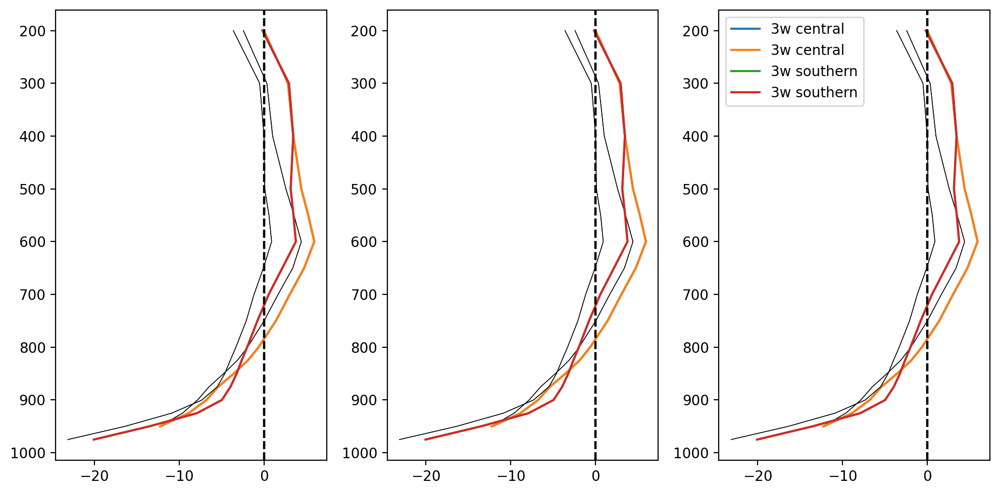

In [23]:
f = plt.figure(figsize=(10,5), dpi=200)

ranges = [(-10,10), (0,6), (-2,3)]

lons = [-74,-74, -63, -63]

for pan, bi in enumerate([(925,600),(925,600),(925,600)]):
    ax = f.add_subplot(1,3,pan+1)
    plt.gca().invert_yaxis()
    
    for ids, dd in enumerate(slices_months):

        slices = dd[1] # d/w mean
        tag = dd[0]

        slices_ttest = dd[2] #  d/w all, for day-wise t-test, all days versus only wet/dry
        slice_clim = dd[3] # doy d/w clim
        clim_ttest = dd[4]
    

        ul = 600
        dl = 850
        
        lon=lons[ids]

        th_es = slices['theta_es'].sel( longitude=lon, method='nearest')
        th_e = slices['theta_e'].sel(level=bi[0], longitude=lon, method='nearest')

        th_es_clim = slice_clim['theta_es'].sel(longitude=lon, method='nearest')
        th_e_clim = slice_clim['theta_e'].sel(level=bi[0],longitude=lon, method='nearest')

        ax.plot(th_e_clim-th_es_clim, th_es.level,  color='k', linewidth=0.5)
        #ax.plot(th_e_cclim-th_es_cclim, th_e.level,  color='brown')
        ax.plot(th_e-th_es, th_es.level,  label=tag)
        
        print(th_e.values)
        
        ax.axvline(0, linestyle='dashed', color='k')
        

#         ax.set_ylim(ranges[pan][0],ranges[pan][1])
#         ax.set_xlim(-74,-66)

plt.tight_layout()
plt.legend()

342.8401930046219
342.8401930046219
344.985611674212
344.985611674212
342.8401930046219
342.8401930046219
344.985611674212
344.985611674212
342.8401930046219
342.8401930046219
344.985611674212
344.985611674212


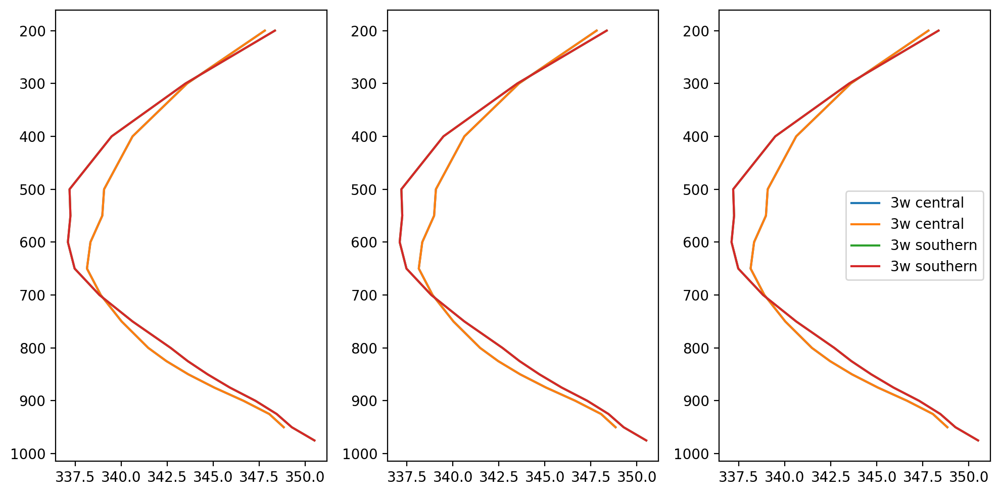

In [24]:
f = plt.figure(figsize=(10,5), dpi=200)

ranges = [(-10,10), (0,6), (-2,3)]

lons = [-74,-74, -63, -63]

for pan, bi in enumerate([(925,550),(900,550),(850,550)]):
    ax = f.add_subplot(1,3,pan+1)
    plt.gca().invert_yaxis()
    
    for ids, dd in enumerate(slices_months):

        slices = dd[1] # d/w mean
        tag = dd[0]

        slices_ttest = dd[2] #  d/w all, for day-wise t-test, all days versus only wet/dry
        slice_clim = dd[3] # doy d/w clim
        clim_ttest = dd[4]
    

        ul = 600
        dl = 850
        
        lon=lons[ids]

        th_es = slices['theta_es'].sel(level=bi[1], longitude=lon, method='nearest')
        th_e = slices['theta_e'].sel(longitude=lon, method='nearest')

        th_es_clim = slice_clim['theta_es'].sel(level=bi[1], longitude=lon, method='nearest')
        th_e_clim = slice_clim['theta_e'].sel(longitude=lon, method='nearest')

        ax.plot( (th_e), th_e.level,  label=tag) #-th_es) - (th_e_cclim-th_es_cclim
        
        #ax.axvline(0, linestyle='dashed', color='k')
        print(th_es.values)

#         ax.set_ylim(ranges[pan][0],ranges[pan][1])
#         ax.set_xlim(-74,-66)

plt.tight_layout()
plt.legend()

#f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/cross/'+var+'_drywet_lineplot_'+pregion+'_DoyClim.jpg')

In [116]:
def readERA(var):
    
    print('Opening', glob.glob('/media/ck/Elements/SouthAmerica/ERA5/hourly/'+var+'_15UTC_1981-*_peru_big.nc')[0])
    u200orig = xr.open_dataset(glob.glob('/media/ck/Elements/SouthAmerica/ERA5/hourly/'+var+'_15UTC_1981-*_peru_big.nc')[0])
    u200orig = uda.flip_lat(u200orig)
    datetimes = pd.to_datetime(u200orig.time.values)
    newtimes = []
    for t in datetimes:
        newtimes.append(t.replace(hour=0))
    u200orig['time'] = ('time', newtimes)
    return u200orig

In [117]:
maps = readERA('v850')
maps = maps.sel(latitude=slice(-25,0), longitude=slice(-81,-55)).load()

Opening /media/ck/Elements/SouthAmerica/ERA5/hourly/v850_15UTC_1981-2019_peru_big.nc


In [118]:
mapsu = readERA('u850')
mapsu = mapsu.sel(latitude=slice(-25,0), longitude=slice(-81,-55)).load()

Opening /media/ck/Elements/SouthAmerica/ERA5/hourly/u850_15UTC_1981-2021_peru_big.nc


In [119]:
mapsq = readERA('q850')
mapsq = mapsq.sel(latitude=slice(-25,0), longitude=slice(-81,-55)).load()

Opening /media/ck/Elements/SouthAmerica/ERA5/hourly/q850_15UTC_1981-2019_peru_big.nc


In [120]:
mapsu2 = readERA('u250')
mapsu2 = mapsu2.sel(latitude=slice(-25,0), longitude=slice(-81,-55)).load()

Opening /media/ck/Elements/SouthAmerica/ERA5/hourly/u250_15UTC_1981-2018_peru_big.nc


In [121]:
mapsv2 = readERA('v250')
mapsv2 = mapsv2.sel(latitude=slice(-25,0), longitude=slice(-81,-55)).load()

Opening /media/ck/Elements/SouthAmerica/ERA5/hourly/v250_15UTC_1981-2018_peru_big.nc


In [122]:
area = 0.15
regionn = 'southern'

In [123]:
dic = pkl.load(open("/home/ck/DIR/cornkle/data/HUARAZ/saves/"+regionn+"_dw_spellDates_"+str(area)+"perc.p", "rb"))
drydates3 = dic['dry3']
wetdates3 = dic['wet3']
drydates5 = dic['dry5']
wetdates5= dic['wet5']
drydates7 = dic['dry7']
wetdates7= dic['wet7']

In [124]:
dd = drydates3#- pd.Timedelta('1days')
wd = wetdates3#- pd.Timedelta('1days')

In [125]:
print(len(dd), len(wd))

139 100


In [126]:
mapsdry = maps.sel(time=dd).mean('time')
mapswet = maps.sel(time=wd).mean('time')

In [127]:
mapsdryq = mapsq.sel(time=dd).mean('time')
mapswetq = mapsq.sel(time=wd).mean('time')

In [128]:
mapsdryu = mapsu.sel(time=dd).mean('time') #-pd.Timedelta('1days')
mapswetu = mapsu.sel(time=wd).mean('time') #-pd.Timedelta('1days')
# mapsdryu2 = mapsu2.sel(time=dd).mean('time') #-pd.Timedelta('1days')
# mapswetu2 = mapsu2.sel(time=wd).mean('time') #-pd.Timedelta('1days')
# mapsdryv2 = mapsv2.sel(time=dd).mean('time') #-pd.Timedelta('1days')
# mapswetv2 = mapsv2.sel(time=wd).mean('time') #-pd.Timedelta('1days')

In [129]:
mapsdryu2 = mapsu2.sel(time=mapsu2['time.month']==10).mean('time') #-pd.Timedelta('1days')
mapswetu2 = mapsu2.sel(time=mapsu2['time.month']==10).mean('time') #-pd.Timedelta('1days')
mapsdryv2 = mapsv2.sel(time=mapsv2['time.month']==10).mean('time')
mapswetv2 = mapsv2.sel(time=mapsv2['time.month']==10).mean('time')

/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


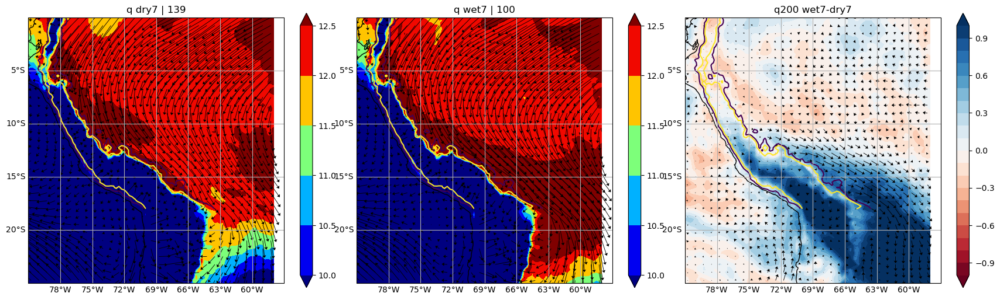

In [130]:
f = plt.figure(figsize=(17,5), dpi=100)

var = 'q'
ax = f.add_subplot(1,3,1, projection=ccrs.PlateCarree())

uanodry = mapsdryu['u']
vanodry = mapsdry['v'] # multiplied by 10 since vertical component is very small compared to horizontal one
uanowet = mapswetu['u']
vanowet = mapswet['v']
st=3
sarrow = 1
xquiv = mapsdryu.longitude[sarrow::st]
yquiv = mapsdryu.latitude[sarrow::st]

uud = (uanodry)[sarrow::st, sarrow::st]  
vvd = (vanodry)[sarrow::st, sarrow::st]

uuw = (uanowet)[sarrow::st, sarrow::st]  
vvw = (vanowet)[sarrow::st, sarrow::st]

ax.coastlines()
        # Gridlines
xl = ax.gridlines(draw_labels=True);
xl.xlabels_top = False
xl.ylabels_right = False

    
plt.contourf(mapsdry.longitude, mapsdry.latitude, mapsdryq[var]*1000, levels=np.arange(10,13,0.5), cmap='jet', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar()
plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,2000])
plt.quiver(xquiv, yquiv, uud, vvd, scale=55, width=0.002, headwidth=7)
ax.set_xlim(-81,-57)
ax.set_ylim(-25,0)
plt.title(var+' dry7 | '+str(len(dd)))

ax = f.add_subplot(1,3,2, projection=ccrs.PlateCarree())
ax.coastlines()
plt.contourf(mapswet.longitude, mapsdry.latitude, mapswetq[var]*1000, levels=np.arange(10,13,0.5), cmap='jet', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar()
plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,2000])
plt.quiver(xquiv, yquiv, uuw, vvw, scale=55, width=0.002, headwidth=7)
xl = ax.gridlines(draw_labels=True);
xl.xlabels_top = False
xl.ylabels_right = False
ax.set_xlim(-81,-57)
ax.set_ylim(-25,0)
plt.title(var+' wet7 | '+str(len(wd)))

ax = f.add_subplot(1,3,3, projection=ccrs.PlateCarree())
ax.coastlines()
plt.contourf(mapswet.longitude, mapsdry.latitude, (mapswetq[var]-mapsdryq[var])*1000, levels=np.arange(-1,1.1,0.1),cmap='RdBu', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar()
plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,2000])
plt.quiver(xquiv, yquiv, uuw-uud, vvw-vvd, scale=55, width=0.002, headwidth=7)
xl = ax.gridlines(draw_labels=True);
xl.xlabels_top = False
xl.ylabels_right = False
ax.set_xlim(-81,-57)
ax.set_ylim(-25,0)
plt.title(var+'200 wet7-dry7')

plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/drywet/'+var+'250_drywet_3day_'+pregion+'_day0.jpg')

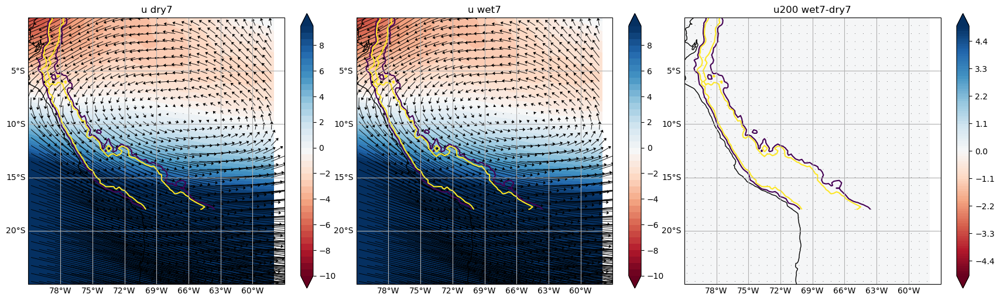

In [131]:
f = plt.figure(figsize=(17,5), dpi=100)

var = 'u'
ax = f.add_subplot(1,3,1, projection=ccrs.PlateCarree())

uanodry = mapsdryu2['u']
vanodry = mapsdryv2['v'] # multiplied by 10 since vertical component is very small compared to horizontal one
uanowet = mapswetu2['u']
vanowet = mapswetv2['v']
st=3
sarrow = 1
xquiv = mapsdryu.longitude[sarrow::st]
yquiv = mapsdryu.latitude[sarrow::st]

uud = (uanodry)[sarrow::st, sarrow::st]  
vvd = (vanodry)[sarrow::st, sarrow::st]

uuw = (uanowet)[sarrow::st, sarrow::st]  
vvw = (vanowet)[sarrow::st, sarrow::st]

ax.coastlines()
        # Gridlines
xl = ax.gridlines(draw_labels=True);
xl.xlabels_top = False
xl.ylabels_right = False

    
plt.contourf(mapsdry.longitude, mapsdry.latitude, mapsdryu2[var], levels=np.arange(-10,10,0.5), cmap='RdBu', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar()
plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,2000])
plt.quiver(xquiv, yquiv, uud, vvd, scale=55, width=0.002, headwidth=7)
ax.set_xlim(-81,-57)
ax.set_ylim(-25,0)
plt.title(var+' dry7')

ax = f.add_subplot(1,3,2, projection=ccrs.PlateCarree())
ax.coastlines()
plt.contourf(mapswet.longitude, mapsdry.latitude, mapswetu2[var], levels=np.arange(-10,10,0.5), cmap='RdBu', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar()
plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,2000])
plt.quiver(xquiv, yquiv, uuw, vvw, scale=55, width=0.002, headwidth=7)
xl = ax.gridlines(draw_labels=True);
xl.xlabels_top = False
xl.ylabels_right = False
ax.set_xlim(-81,-57)
ax.set_ylim(-25,0)
plt.title(var+' wet7')

ax = f.add_subplot(1,3,3, projection=ccrs.PlateCarree())
ax.coastlines()
plt.contourf(mapswet.longitude, mapsdry.latitude, (mapswetu2[var]-mapsdryu2[var]), levels=np.arange(-5,5.1,0.1),cmap='RdBu', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar()
plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,2000])
plt.quiver(xquiv, yquiv, uuw-uud, vvw-vvd, scale=55, width=0.002, headwidth=7)
xl = ax.gridlines(draw_labels=True);
xl.xlabels_top = False
xl.ylabels_right = False
ax.set_xlim(-81,-57)
ax.set_ylim(-25,0)
plt.title(var+'200 wet7-dry7')

plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/drywet/'+var+'250_drywet_3day_'+pregion+'_day0.jpg')

In [133]:
mcs = xr.open_mfdataset('/media/ck/Elements/SouthAmerica/CHIRPS/SA_daily_onERA/CHIRPS_daily_onERA_*.nc')

In [134]:
#tir = mcs['tir'].sel(time=((mcs['time.year']>=1985)&(mcs['time.year']<=2018))).sel(latitude=slice(-25,0), longitude=slice(-81,-58)).load()
tir = mcs['precip'].sel(time=((mcs['time.year']>=1985)&(mcs['time.year']<=2018))).sel(latitude=slice(-25,0), longitude=slice(-81,-58)).load()

In [135]:
drytir = np.intersect1d(tir.time.values, dd)

In [136]:
wettir = np.intersect1d(tir.time.values, wd )

In [137]:
# tirdry = tir.where(tir<-3000).sel(time=drytir).count('time')/len(drytir)*100
# tirwet = tir.where(tir<-3000).sel(time=wettir).count('time')/len(wettir)*100

In [138]:
tirdry = tir.where(tir>2).sel(time=drytir).count('time')/len(drytir)*100
tirwet = tir.where(tir>2).sel(time=wettir).count('time')/len(wettir)*100

In [139]:
tirdry

<xarray.DataArray 'precip' (latitude: 101, longitude: 93)>
array([[ 0.        ,  0.        ,  0.        , ..., 26.61870504,
        27.3381295 , 28.77697842],
       [ 0.        ,  0.        ,  0.        , ..., 26.61870504,
        27.3381295 , 26.61870504],
       [ 0.        ,  0.        ,  0.        , ..., 25.17985612,
        26.61870504, 28.77697842],
       ...,
       [ 0.        ,  0.        ,  0.        , ..., 34.5323741 ,
        38.1294964 , 34.5323741 ],
       [ 0.        ,  0.        ,  0.        , ..., 31.65467626,
        28.77697842, 30.21582734],
       [ 0.        ,  0.        ,  0.        , ..., 30.9352518 ,
        26.61870504, 25.17985612]])
Coordinates:
  * longitude  (longitude) float32 -81.0 -80.75 -80.5 ... -58.5 -58.25 -58.0
  * latitude   (latitude) float32 -25.0 -24.75 -24.5 -24.25 ... -0.5 -0.25 0.0

In [140]:
len(drytir)

139

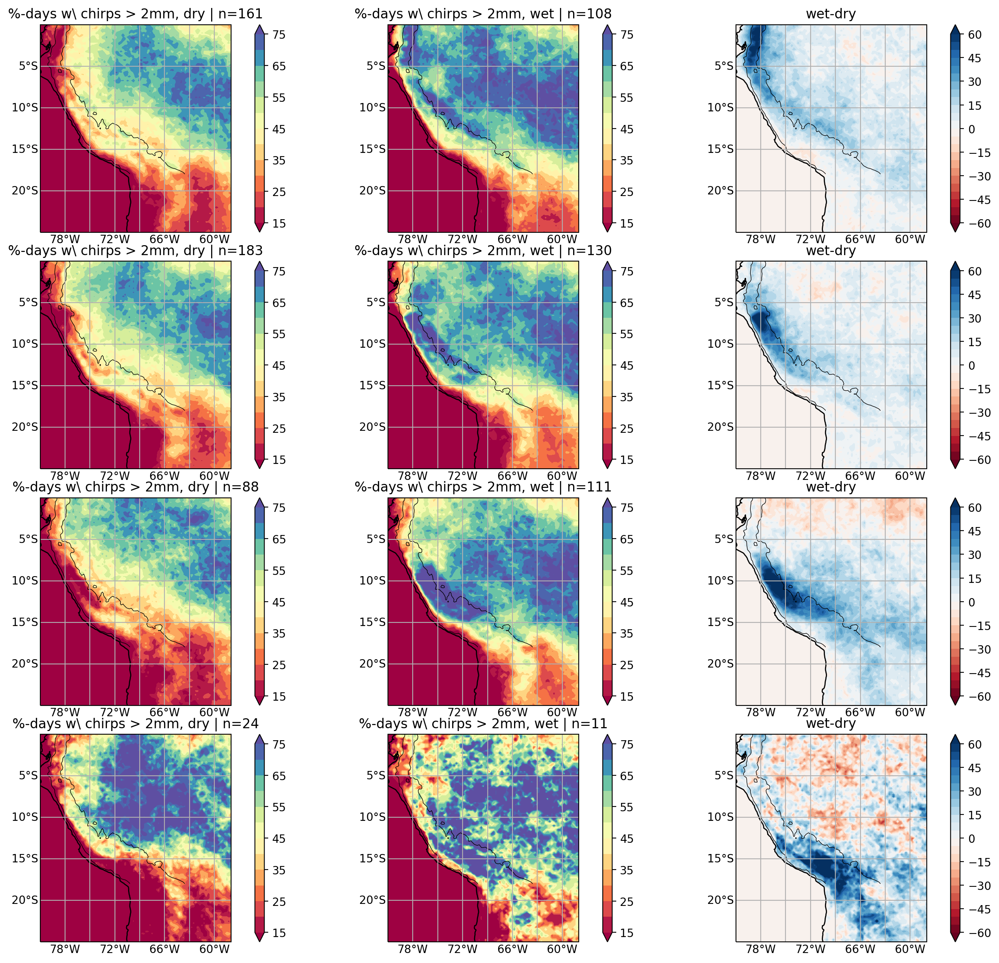

In [150]:
area = 0.25
f = plt.figure(figsize=(15,12), dpi=200)
plus = [1,2,3]
cnt = 0

for ids, reg in enumerate(['equatorial', 'transition', 'central', 'southern']):
    
    dic = pkl.load(open("/home/ck/DIR/cornkle/data/HUARAZ/saves/"+reg+"_dw_spellDates_"+str(area)+"perc.p", "rb"))
    
    dd = dic['dry3']#- pd.Timedelta('1days')
    wd = dic['wet3']#- pd.Timedelta('1days')
    drytir = np.intersect1d(tir.time.values, dd)
    wettir = np.intersect1d(tir.time.values, wd)
    
    tirdry = tir.where(tir>2).sel(time=drytir).count('time')/len(drytir)*100
    tirwet = tir.where(tir>2).sel(time=wettir).count('time')/len(wettir)*100

    ax = f.add_subplot(4,3,(ids+1)+cnt, projection=ccrs.PlateCarree())


    ax.coastlines()
            # Gridlines
    xl = ax.gridlines(draw_labels=True);
    xl.top_labels = False
    xl.right_labels = False


    plt.contourf(tirdry.longitude, tirdry.latitude, tirdry, levels=np.arange(15,76,5), cmap='Spectral', transform=ccrs.PlateCarree(), extend='both')
    plt.colorbar()
    plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,6000], colors='k', linewidths=0.5)
    ax.set_xlim(-81,-58)
    ax.set_ylim(-25,0)
    plt.title('%-days w\ chirps > 2mm, dry | n='+str(len(dd)))

    ax = f.add_subplot(4,3,ids+2+cnt, projection=ccrs.PlateCarree())
    ax.coastlines()
    plt.contourf(tirwet.longitude, tirwet.latitude, tirwet, levels=np.arange(15,76,5), cmap='Spectral', transform=ccrs.PlateCarree(), extend='both')
    plt.colorbar()
    plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,6000], colors='k', linewidths=0.5)
    xl = ax.gridlines(draw_labels=True);
    xl.top_labels = False
    xl.right_labels = False
    ax.set_xlim(-81,-58)
    ax.set_ylim(-25,0)
    plt.title('%-days w\ chirps > 2mm, wet | n='+str(len(wd)))

    ax = f.add_subplot(4,3,ids+3+cnt, projection=ccrs.PlateCarree())
    ax.coastlines()
    plt.contourf(tirwet.longitude, tirwet.latitude, (tirwet-tirdry), levels=np.arange(-60,61,5), cmap='RdBu', transform=ccrs.PlateCarree(), extend='both')
    plt.colorbar()
    plt.contour(height.longitude, height.latitude, height['h'], levels=[1000,6000], colors='k', linewidths=0.5)
    xl = ax.gridlines(draw_labels=True);
    xl.top_labels = False
    xl.right_labels = False
    ax.set_xlim(-81,-58)
    ax.set_ylim(-25,0)
    plt.title('wet-dry')
    
    cnt +=2

    plt.tight_layout()
    #f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/correlations/drywet/gridsat_3days_day0_'+pregion+'.jpg')